In [ ]:
import subprocess
import sys, os, time
import torch, transformers, accelerate

print(f"PyTorch:         {torch.__version__}")
print(f"CUDA доступна:   {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU:             {torch.cuda.get_device_name(0)}")

PyTorch:         2.10.0+cu128
CUDA доступна:   True
GPU:             Tesla T4


In [ ]:
def pip_install(pkgs):
    cmd = [sys.executable, "-m", "pip", "install", "-q"] + pkgs
    subprocess.check_call(cmd)

pip_install([
    "transformers>=4.45.0",
    "accelerate>=0.34.0",
    "qwen-vl-utils",
    "pymupdf",
    "opencv-python",
    "matplotlib",
    "Pillow",
])

In [ ]:
REPO_DIR = "/content/TAM"

if not os.path.exists(REPO_DIR):
    subprocess.check_call([
        "git", "clone", "--depth", "1",
        "https://github.com/xmed-lab/TAM.git",
        REPO_DIR,
    ])
    print("Репозиторий сlone.")
else:
    print("Репозиторий already exists")

for entry in sorted(os.listdir(REPO_DIR)):
    full = os.path.join(REPO_DIR, entry)
    marker = "DIR " if os.path.isdir(full) else "FILE"
    print(f"  [{marker}] {entry}")


Репозиторий сlone.
  [DIR ] .git
  [FILE] README.md
  [FILE] demo.py
  [FILE] eval.py
  [DIR ] imgs
  [FILE] qwen_utils.py
  [FILE] requirements.txt
  [FILE] tam.py


In [ ]:
REPO_DIR = "/content/TAM"
result = subprocess.run(
    ["grep", "-rn", "--include=*.py", "def TAM", REPO_DIR],
    capture_output=True, text=True
)
print(result.stdout)

/content/TAM/tam.py:440:def TAM(tokens, vision_shape, logit_list, special_ids, vision_input, \



In [ ]:
MODEL_NAME = "Qwen/Qwen2-VL-2B-Instruct"
IMG_PATH = "/content/TAM/imgs/demo.jpg"
PROMPT = "Describe this image in detail."
sys.path.insert(0, "/content/TAM")
import torch
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_utils import process_vision_info


t0 = time.time()
processor = AutoProcessor.from_pretrained(MODEL_NAME)
print(f"готово за {time.time() - t0:.1f}s")

t0 = time.time()
model = Qwen2VLForConditionalGeneration.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16,
    device_map="auto",
)

model.eval()
print(f"готово за {time.time() - t0:.1f}s")
print(f"VRAM занято: {torch.cuda.memory_allocated() / 1e9:.2f} GB")

print("вход")
messages = [{
    "role": "user",
    "content": [
        {"type": "image", "image": IMG_PATH},
        {"type": "text",  "text":  PROMPT},
    ],
}]

text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text], images=image_inputs, videos=video_inputs,
    padding=True, return_tensors="pt",
).to(model.device)
print(f"input_ids shape: {tuple(inputs['input_ids'].shape)}")
print(f"image_grid_thw:  {inputs['image_grid_thw'].tolist()}")

t0 = time.time()
with torch.no_grad():
    out_ids = model.generate(**inputs, max_new_tokens=64, do_sample=False)
print(f"готово за {time.time() - t0:.1f}s")

gen_only = out_ids[:, inputs["input_ids"].shape[1]:]
answer = processor.batch_decode(gen_only, skip_special_tokens=True)[0]
print(answer)
print(f"VRAM сейчас: {torch.cuda.memory_allocated() / 1e9:.2f} GB / 15 GB")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/347 [00:00<?, ?B/s]

chat_template.json: 0.00B [00:00, ?B/s]

The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

готово за 4.2s


model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/729 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

готово за 126.2s
VRAM занято: 4.42 GB
вход


The following generation flags are not valid and may be ignored: ['temperature', 'top_p', 'top_k']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


input_ids shape: (1, 2016)
image_grid_thw:  [[1, 78, 102]]
готово за 8.9s
The image shows two pugs sitting in circular, colorful chairs. The chairs are designed with a playful and whimsical theme, featuring a blue and pink color scheme. The pugs are sitting on the chairs with their front paws resting on the armrests and their back paws on the seat. The chairs have
VRAM сейчас: 4.47 GB / 15 GB


In [ ]:
import os, gc, time
import torch
from tam import TAM

SAVE_DIR = "/content/TAM/imgs/vis_img"
os.makedirs(SAVE_DIR, exist_ok=True)
gc.collect()
torch.cuda.empty_cache()

t0 = time.time()
with torch.no_grad():
    outputs = model.generate(
        **inputs,
        max_new_tokens=32,
        do_sample=False,
        use_cache=True,
        output_hidden_states=True,
        return_dict_in_generate=True,
    )
print(f"время {time.time() - t0:.1f}s")
print(f"число шагов генерации: {len(outputs.hidden_states)}")
print(f"слоёв в одном шаге: {len(outputs.hidden_states[0])}")

generated_ids = outputs.sequences
gen_only = generated_ids[:, inputs["input_ids"].shape[1]:]
answer_text = processor.batch_decode(gen_only, skip_special_tokens=True)[0]
print(f"Ответ модели: {answer_text!r}")

print("\nлогиты")
logits = [model.lm_head(feats[-1]) for feats in outputs.hidden_states]
print(f"logits length: {len(logits)}, shape[0]: {tuple(logits[0].shape)}")


special_ids = {
    'img_id':    [151652, 151653],
    'prompt_id': [151653, [151645, 198, 151644, 77091]],
    'answer_id': [[198, 151644, 77091, 198], -1],
}
vision_shape = (
    int(inputs['image_grid_thw'][0, 1] // 2),
    int(inputs['image_grid_thw'][0, 2] // 2),
)
print(f"vision_shape (h, w) = {vision_shape}")


vis_inputs = image_inputs
t0 = time.time()
raw_map_records = []
for i in range(len(logits)):
    _ = TAM(
        generated_ids[0].cpu().tolist(),
        vision_shape,
        logits,
        special_ids,
        vis_inputs,
        processor,
        os.path.join(SAVE_DIR, f"{i}.jpg"),
        i,
        raw_map_records,
        False,
    )
print(f"время {time.time() - t0:.1f}s")

saved = sorted(os.listdir(SAVE_DIR))
print(f"\nСохранено файлов: {len(saved)}")
print(f"Папка: {SAVE_DIR}")
print("Первые 10 файлов:", saved[:10])

время 4.0s
число шагов генерации: 32
слоёв в одном шаге: 29
Ответ модели: 'The image shows two pugs sitting in circular, colorful chairs. The chairs are designed with a playful and whimsical theme, featuring a blue and pink color scheme'

логиты
logits length: 32, shape[0]: (1, 2016, 151936)
vision_shape (h, w) = (39, 51)
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualiza

Визуализация

разрешение: (1920, 1097)


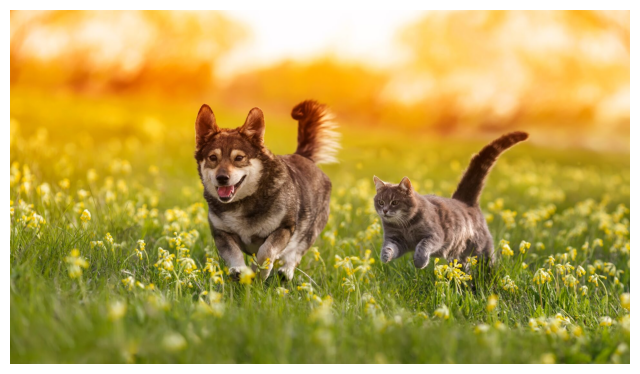


вход
input_ids shape: (1, 2718)
image_grid_thw:  [[1, 78, 138]]
время 6.0s

Ответ модели: 'The image depicts a lively scene of a dog and a cat running through a vibrant field of yellow flowers. The dog, which appears to be a mix of breeds'
vision_shape: (39, 69)
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip text visualization, please check the installation of texlive-xetex.
Skip t

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from qwen_utils import process_vision_info


IMG_URL = "https://www.tierpension-haas.de/assets/images/d/tierpension-haas-hunde-katzen-natur-0fa18a56.jpeg"
IMG_PATH2 = "/content/TAM/imgs/custom.jpg"
SAVE_DIR2 = "/content/TAM/imgs/vis_img2"
PROMPT2 = "Describe this image in detail."

subprocess.check_call([
    "wget", "-q", "--user-agent=Mozilla/5.0",
    "-O", IMG_PATH2, IMG_URL,
])
size_mb = os.path.getsize(IMG_PATH2) / 1e6

img_pil = Image.open(IMG_PATH2).convert("RGB")
print(f"разрешение: {img_pil.size}")
plt.figure(figsize=(8, 6))
plt.imshow(img_pil)
plt.axis("off")
plt.show()

print("\nвход")
messages2 = [{
    "role": "user",
    "content": [
        {"type": "image", "image": IMG_PATH2},
        {"type": "text",  "text":  PROMPT2},
    ],
}]
text2 = processor.apply_chat_template(messages2, tokenize=False, add_generation_prompt=True)
image_inputs2, video_inputs2 = process_vision_info(messages2)
inputs2 = processor(
    text=[text2], images=image_inputs2, videos=video_inputs2,
    padding=True, return_tensors="pt",
).to(model.device)
print(f"input_ids shape: {tuple(inputs2['input_ids'].shape)}")
print(f"image_grid_thw:  {inputs2['image_grid_thw'].tolist()}")


gc.collect(); torch.cuda.empty_cache()
t0 = time.time()
with torch.no_grad():
    outputs2 = model.generate(
        **inputs2,
        max_new_tokens=32,
        do_sample=False,
        use_cache=True,
        output_hidden_states=True,
        return_dict_in_generate=True,
    )
print(f"время {time.time() - t0:.1f}s")

generated_ids2 = outputs2.sequences
gen_only2 = generated_ids2[:, inputs2["input_ids"].shape[1]:]
answer2 = processor.batch_decode(gen_only2, skip_special_tokens=True)[0]
print(f"\nОтвет модели: {answer2!r}")

os.makedirs(SAVE_DIR2, exist_ok=True)
logits2 = [model.lm_head(feats[-1]) for feats in outputs2.hidden_states]

special_ids = {
    'img_id':[151652, 151653],
    'prompt_id': [151653, [151645, 198, 151644, 77091]],
    'answer_id': [[198, 151644, 77091, 198], -1],
}
vision_shape2 = (
    int(inputs2['image_grid_thw'][0, 1] // 2),
    int(inputs2['image_grid_thw'][0, 2] // 2),
)
print(f"vision_shape: {vision_shape2}")

t0 = time.time()
raw_map_records2 = []
for i in range(len(logits2)):
    _ = TAM(
        generated_ids2[0].cpu().tolist(),
        vision_shape2,
        logits2,
        special_ids,
        image_inputs2,
        processor,
        os.path.join(SAVE_DIR2, f"{i}.jpg"),
        i,
        raw_map_records2,
        False,
    )
print(f"полное время {time.time() - t0:.1f}s")

gen_token_ids2 = generated_ids2[0, inputs2["input_ids"].shape[1]:].cpu().tolist()
gen_tokens_text2 = [processor.tokenizer.decode([tid]) for tid in gen_token_ids2]

for i, tok in enumerate(gen_tokens_text2):
    print(f"  {i:2d}: {tok!r}")

n_saved = len([f for f in os.listdir(SAVE_DIR2) if f.endswith(".jpg")])

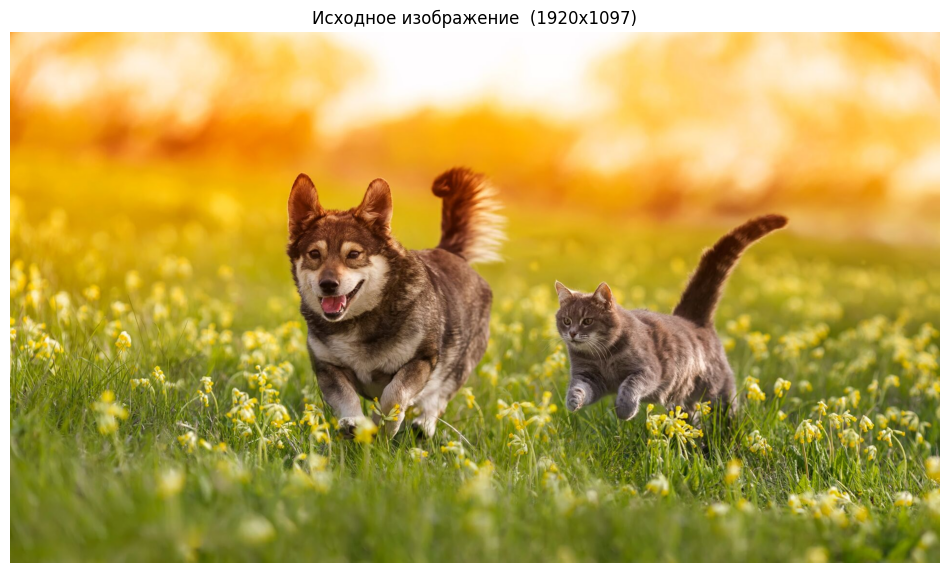

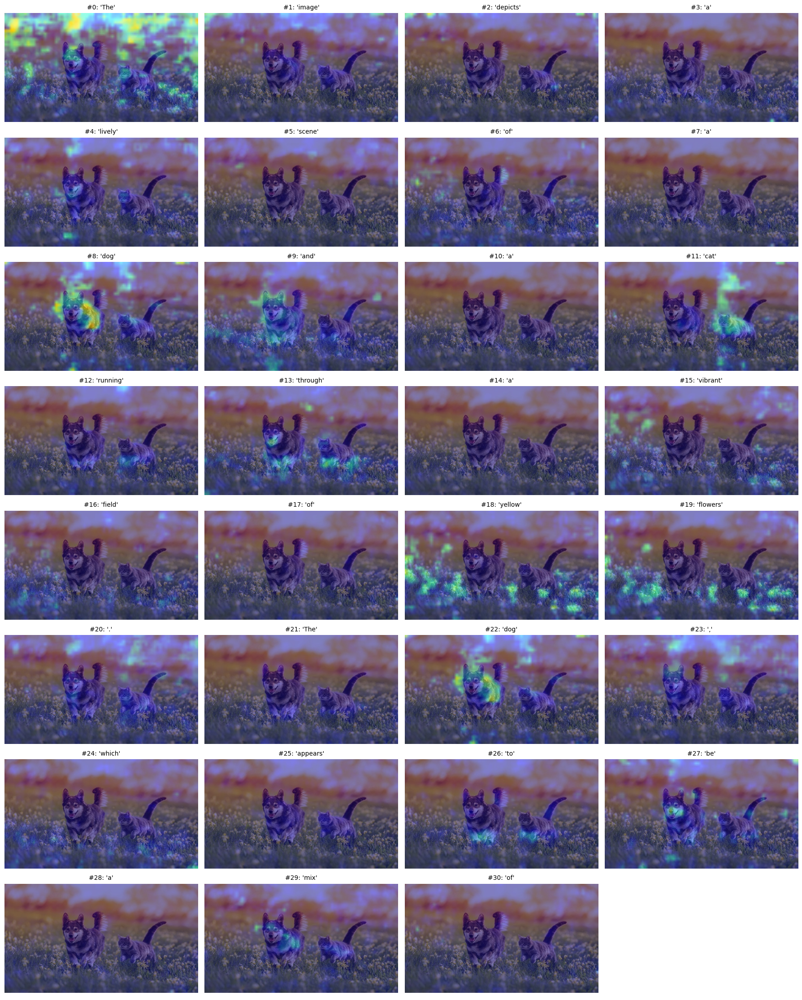


Показано heatmap'ов: 31


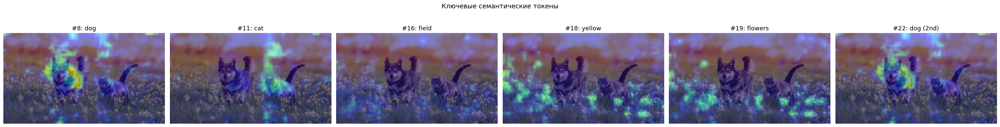

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

SAVE_DIR2 = "/content/TAM/imgs/vis_img2"
IMG_PATH2 = "/content/TAM/imgs/custom.jpg"


orig = Image.open(IMG_PATH2)
plt.figure(figsize=(12, 7))
plt.imshow(orig)
plt.title(f"Исходное изображение  ({orig.size[0]}x{orig.size[1]})", fontsize=12)
plt.axis("off")
plt.show()

n = len(gen_tokens_text2)
cols = 4
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4.5, rows * 2.8))
axes = axes.flatten()

shown = 0
for i in range(rows * cols):
    ax = axes[i]
    ax.axis("off")
    if i >= n:
        continue
    heatmap_path = os.path.join(SAVE_DIR2, f"{i}.jpg")
    if not os.path.exists(heatmap_path):
        continue
    img = Image.open(heatmap_path)
    ax.imshow(img)
    tok = gen_tokens_text2[i].replace("\n", "\\n").strip()
    if tok == "":
        tok = "(space)"
    ax.set_title(f"#{i}: {tok!r}", fontsize=10)
    shown += 1

plt.tight_layout()
plt.savefig("/content/TAM/imgs/tam_grid_custom.jpg", dpi=100, bbox_inches="tight")
plt.show()
print(f"\nПоказано heatmap'ов: {shown}")

key_tokens = {
    8:  'dog',
    11: 'cat',
    16: 'field',
    18: 'yellow',
    19: 'flowers',
    22: 'dog (2nd)',
}
key_existing = [(idx, label) for idx, label in key_tokens.items()
                if os.path.exists(os.path.join(SAVE_DIR2, f"{idx}.jpg"))]

if key_existing:
    fig, axes = plt.subplots(1, len(key_existing),
                             figsize=(5 * len(key_existing), 4))
    if len(key_existing) == 1:
        axes = [axes]
    for ax, (idx, label) in zip(axes, key_existing):
        img = Image.open(os.path.join(SAVE_DIR2, f"{idx}.jpg"))
        ax.imshow(img)
        ax.set_title(f"#{idx}: {label}", fontsize=13)
        ax.axis("off")
    plt.suptitle("Ключевые семантические токены", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.savefig("/content/TAM/imgs/tam_key_tokens.jpg", dpi=100, bbox_inches="tight")
    plt.show()

In [ ]:
import numpy as np

SAVE_DIR2 = "/content/TAM/imgs/vis_img2"

def heatmap_metrics(rgb_img: np.ndarray):
    r = rgb_img[..., 0].astype(np.float32)
    b = rgb_img[..., 2].astype(np.float32)
    act = r - b
    act = act - act.min()
    if act.max() > 0:
        act = act / act.max()

    hist, _ = np.histogram(act, bins=32, range=(0.0, 1.0), density=True)
    hist = hist / (hist.sum() + 1e-9)
    entropy = float(-np.sum(hist * np.log(hist + 1e-9)))
    threshold = np.quantile(act, 0.90)
    top_frac = float((act >= threshold).mean())
    top1 = np.quantile(act, 0.99)
    mean_top = float(act[act >= top1].mean()) if (act >= top1).any() else 0.0
    return {"entropy": entropy, "top_frac": top_frac, "peak": mean_top}

In [ ]:
records = []
for i, tok in enumerate(gen_tokens_text2):
    path = os.path.join(SAVE_DIR2, f"{i}.jpg")
    if not os.path.exists(path):
        continue
    img = np.array(Image.open(path).convert("RGB"))
    m = heatmap_metrics(img)
    m["idx"] = i
    m["token"] = tok.strip() or "(sp)"
    records.append(m)

idxs     = [r["idx"]     for r in records]
tokens   = [r["token"]   for r in records]
entropy  = np.array([r["entropy"]  for r in records])
top_frac = np.array([r["top_frac"] for r in records])
peak     = np.array([r["peak"]     for r in records])

content_words = {"dog", "cat", "field", "flowers", "yellow", "lively",
                 "scene", "vibrant", "running", "mix", "breeds", "image", "depicts"}
is_content = np.array([t in content_words for t in tokens])

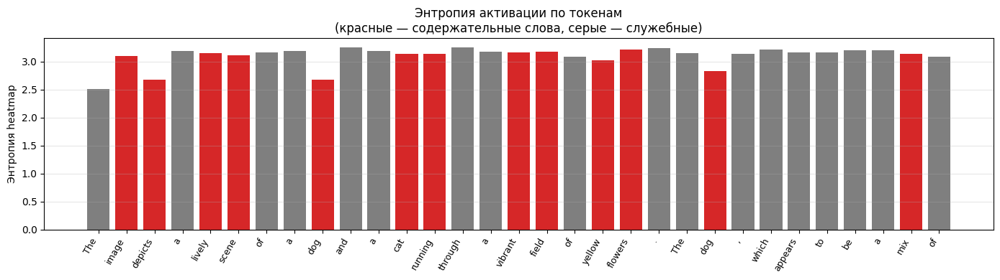

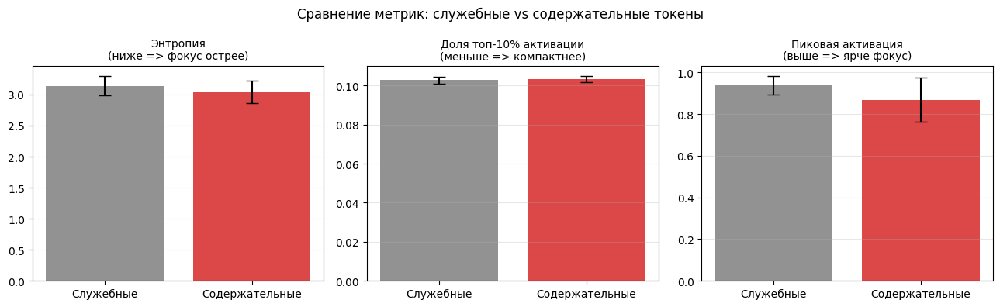

Всего токенов с heatmap'ами: 31
содержательных: 13(['image', 'depicts', 'lively', 'scene', 'dog', 'cat', 'running', 'vibrant', 'field', 'yellow', 'flowers', 'dog', 'mix'])
служебных:18

Средняя доля топ-10%:
служебные:0.103
содержательные: 0.103

Пиковая активация:
служебные:0.939
содержательные: 0.869


In [ ]:
fig, ax = plt.subplots(figsize=(14, 4))
colors = ["tab:red" if c else "tab:gray" for c in is_content]
ax.bar(range(len(tokens)), entropy, color=colors)
ax.set_xticks(range(len(tokens)))
ax.set_xticklabels(tokens, rotation=60, ha="right", fontsize=9)
ax.set_ylabel("Энтропия heatmap")
ax.set_title("Энтропия активации по токенам\n(красные — содержательные слова, серые — служебные)")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.savefig("/content/TAM/imgs/metric_entropy.jpg", dpi=100, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
metrics_data = [
    ("Энтропия\n(ниже => фокус острее)",     entropy),
    ("Доля топ-10% активации\n(меньше => компактнее)", top_frac),
    ("Пиковая активация\n(выше => ярче фокус)", peak),
]
for ax, (title, values) in zip(axes, metrics_data):
    means = [values[~is_content].mean(), values[is_content].mean()]
    stds  = [values[~is_content].std(),  values[is_content].std()]
    ax.bar(["Служебные", "Содержательные"], means, yerr=stds,
           color=["tab:gray", "tab:red"], capsize=6, alpha=0.85)
    ax.set_title(title, fontsize=10)
    ax.grid(axis="y", alpha=0.3)
plt.suptitle("Сравнение метрик: служебные vs содержательные токены", fontsize=12)
plt.tight_layout()
plt.savefig("/content/TAM/imgs/metric_compare.jpg", dpi=100, bbox_inches="tight")
plt.show()

print(f"Всего токенов с heatmap'ами: {len(records)}")
print(f"содержательных: {is_content.sum()}({[t for t,c in zip(tokens,is_content) if c]})")
print(f"служебных:{(~is_content).sum()}")
print(f"\nСредняя доля топ-10%:")
print(f"служебные:{top_frac[~is_content].mean():.3f}")
print(f"содержательные: {top_frac[is_content].mean():.3f}")
print(f"\nПиковая активация:")
print(f"служебные:{peak[~is_content].mean():.3f}")
print(f"содержательные: {peak[is_content].mean():.3f}")

В этом примере метод TAM оказался полезным для анализа работы мультимодальной модели. Он показывает, на какие части изображения модель обращает внимание при генерации отдельных слов.

Для слов вроде dog и cat подсветка действительно попадает на собаку и кошку, а для слов yellow и flowers — на жёлтые цветы на фоне. При этом для служебных слов, например a, to, of, внимание распределено более размыто, что выглядит логично.

Также метрики показывают, что для смысловых слов фокус внимания немного более чёткий, чем для служебных. Это подтверждает, что модель связывает важные слова из ответа с соответствующими областями изображения.

В целом описание модели соответствует картинке, явных ошибок или галлюцинаций в этом примере не видно. Поэтому можно сказать, что TAM хорошо подходит как инструмент интерпретации: он помогает понять, действительно ли модель «смотрит» на нужные объекты при описании изображения.

При этом у метода есть ограничения: карты внимания имеют не очень высокое разрешение, поэтому детали видны грубо. Кроме того, простые численные метрики могут быть шумными, особенно если считать их по сохранённым jpg-картинкам.
